## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Step 1: compute the camera calibration using chessboard images

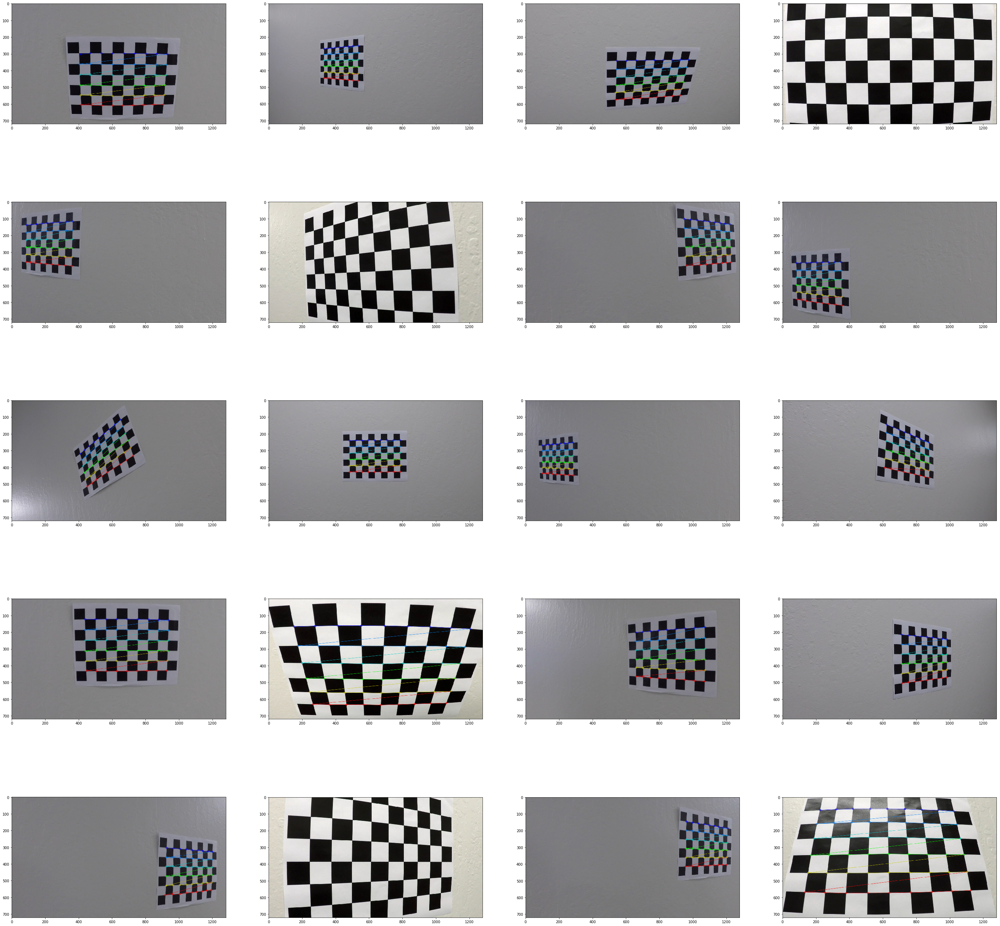

In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
# images = glob.glob('camera_cal/calibration*.jpg')
cal_images = os.listdir("camera_cal/")

# Step through the list and search for chessboard corners
fig = plt.figure(figsize=(50, 50))
columns = 4
rows = 5
i = 1

for cal_image in cal_images:
    img = mpimg.imread("camera_cal/" + cal_image)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

    fig.add_subplot(rows, columns, i)
    plt.imshow(img)      
    i = i + 1

## Step 2: apply a distortion correction to raw images

First, run a test on a chessboard image

(1280, 720)


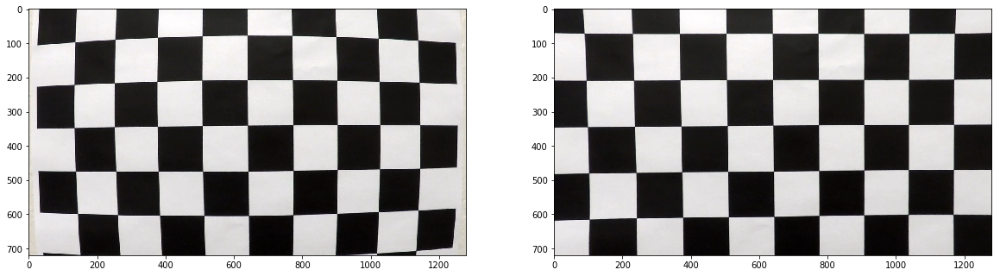

In [2]:
#reading in an image for test
image = mpimg.imread('camera_cal/calibration1.jpg')
size = (image.shape[1], image.shape[0])
print(size)
# Calculate the distortion coefficients using cv2.calibrateCamera() 
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, size, None, None)

# undistort the image using cv2.undistort()
def cal_undistort(img):
    # Use cv2.undistort()
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

undist_img = cal_undistort(image)

# plot for comparison
fig = plt.figure(figsize=(20, 20))
columns = 2
rows = 1
fig.add_subplot(rows, columns, 1)
plt.imshow(image)
fig.add_subplot(rows, columns, 2)
plt.imshow(undist_img)

It is shown the cal_undistort() can succussfully recover the distorted image, then i run a test on all test_images and save them to "output_images/"

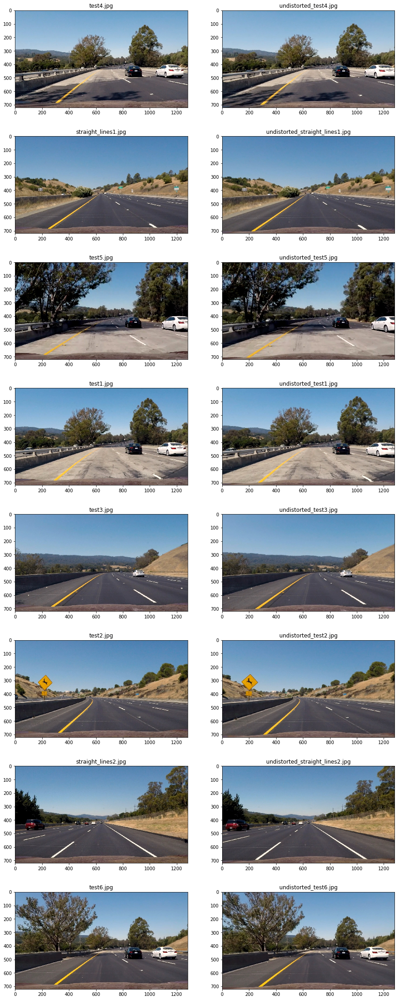

In [3]:
test_images = os.listdir("test_images/")
fig = plt.figure(figsize=(15, 40))
columns = 2
rows = 8
i = 1

# create an empty list to store current images for the manipulation in the next step
undist_images = []

for test_image in test_images:
    img = mpimg.imread("test_images/" + test_image)
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    ax1.set_title(test_image)
    i = i + 1
    undist_test_img = cal_undistort(img)
    undist_images.append(undist_test_img)
    ax2 = fig.add_subplot(rows, columns, i)
    plt.imshow(undist_test_img)
    ax2.set_title("undistorted_"+test_image)
    i = i + 1

plt.savefig("output_images/undistorted_images")

## Step 3: use color transforms, gradients, etc., to create a thresholded binary image

#### Define sobel thresh functions and tune the parameters

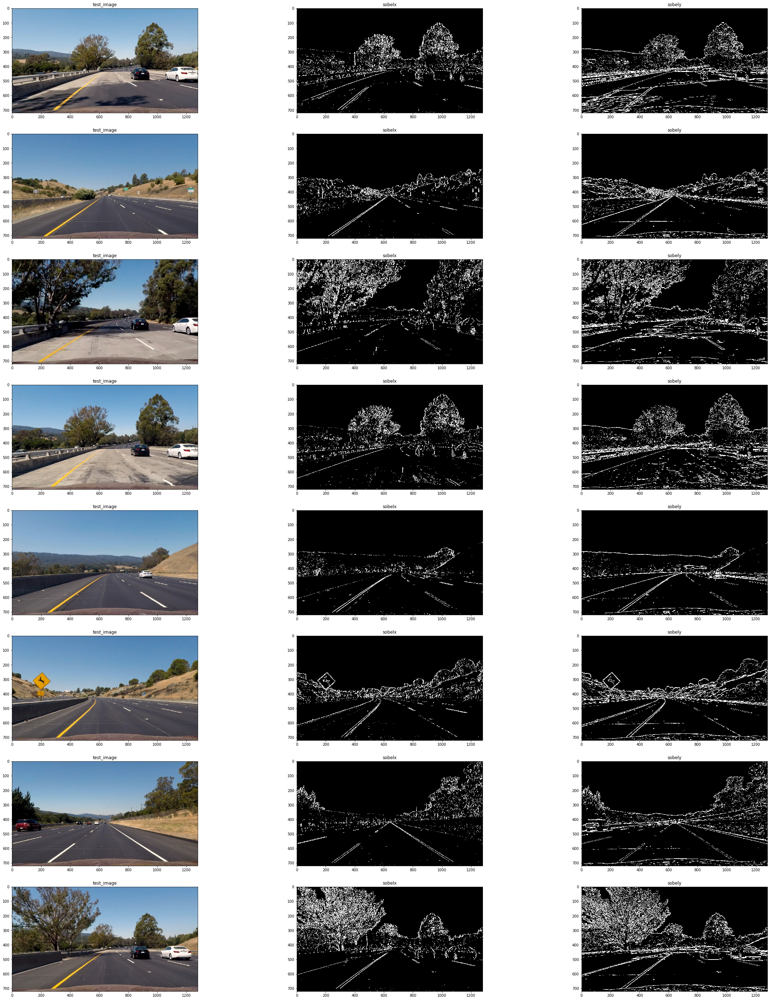

In [4]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray,cv2.CV_64F,1,0)
    elif orient=='y':
        sobel = cv2.Sobel(gray,cv2.CV_64F,0,1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

fig = plt.figure(figsize=(40, 50))
columns = 3
rows = 8
i = 1

for image in undist_images:
    # plot the original image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image)
    ax1.set_title("test_image")
    i = i + 1 
    
     # plot the sobelx binary image
    ax2 = fig.add_subplot(rows, columns, i)
    sobelx_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
    plt.imshow(sobelx_binary, cmap='gray')
    ax2.set_title("sobelx")
    i = i + 1 
    
    # plot the sobely binary image
    ax3 = fig.add_subplot(rows, columns, i)
    sobely_binary = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
    plt.imshow(sobely_binary, cmap='gray')
    ax3.set_title("sobely")
    i = i + 1       

From the above images, as the lanes are near vertical, the sobelx filter performs better than the sobely filter. So i only integrate the sobelx filter in the combined filter.

#### Define the thresh magnitude and direction filter and tune the parameters

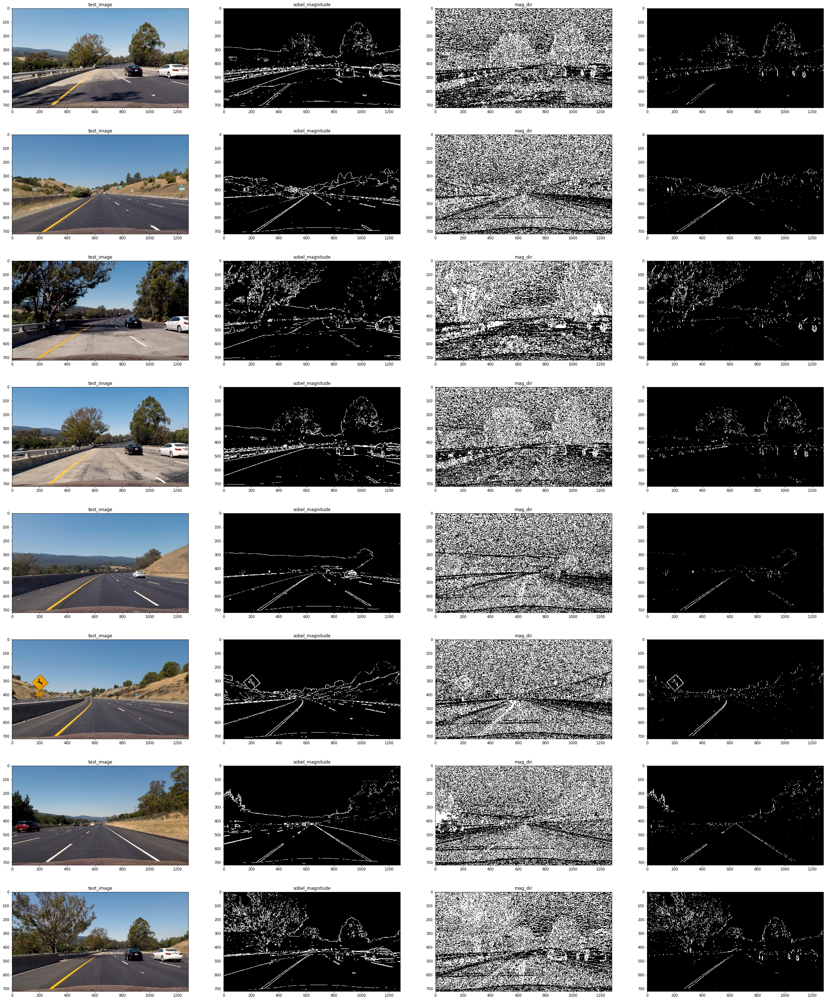

In [5]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2) 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))    
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    # 6) Return this mask as your binary_output image
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):

    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)    
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    dir_sobel = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir_sobel)
    binary_output[(dir_sobel >= thresh[0]) & (dir_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output


fig = plt.figure(figsize=(40, 50))
columns = 4
rows = 8
i = 1

for image in undist_images:
    # plot the original image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image)
    ax1.set_title("test_image")
    i = i + 1 
    
    # plot the sobel magnitude binary image
    ax2 = fig.add_subplot(rows, columns, i)
    mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(50, 200))
    plt.imshow(mag_binary, cmap='gray')
    ax2.set_title("sobel_magnitude")
    i = i + 1 
    
    # plot the sobel direction binary image
    ax3 = fig.add_subplot(rows, columns, i)
    dir_binary = dir_threshold(image, sobel_kernel=5, thresh=(0, 1))  
    plt.imshow(dir_binary, cmap='gray')
    ax3.set_title("sobel_dir")
    i = i + 1 
    
    # plot the sobel mag and direction bitwise.and() binary image
    ax4 = fig.add_subplot(rows, columns, i)
    mag_dir_binary = np.zeros_like(dir_binary)
    mag_dir_binary[(mag_binary == 1) & (dir_binary == 1)] = 1
    plt.imshow(mag_dir_binary, cmap='gray')
    ax3.set_title("mag_dir")
    i = i + 1     

The combined magnitude and direction filter has similar performance to the sobelx filter

#### Define the HLS s and h channel filter

In [ ]:
def hls_s(img, thresh=(0, 255)):

    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    binary_output[ (S>thresh[0]) & (S <=thresh[1])] = 1
    # 3) Return a binary image of threshold result
    
    ## add sobelx
    sobelx_s = cv2.Sobel(binary_output,cv2.CV_64F,1,0)
    abs_sobel_s = np.absolute(sobelx_s)
    scaled_sobel_s = np.uint8(255*abs_sobel_s/np.max(abs_sobel_s))
    binary_output_s = np.zeros_like(scaled_sobel_s)
    binary_output_s[(scaled_sobel_s >= 10) & (scaled_sobel_s <= 100)] = 1
    ##
    
    return binary_output_s

def hls_h(img, thresh=(0, 255)):

    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    # 2) Apply a threshold to the H channel
    binary_output = np.zeros_like(H)
    binary_output[ (H>thresh[0]) & (H <=thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output


fig = plt.figure(figsize=(40, 100))
columns = 3
rows = 8
i = 1

for image in undist_images:
    # plot the original image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image)
    ax1.set_title("test_image")
    i = i + 1 

    # plot the HSL S binary image
    ax2 = fig.add_subplot(rows, columns, i)
    hls_s_binary = hls_s(image, thresh=(90, 255))
    plt.imshow(hls_s_binary, cmap='gray')
    ax2.set_title("hsl_s")
    i = i + 1 
    
    """
    # plot the HSL S then sobelx 
    ax3 = fig.add_subplot(rows, columns, i)
    sobelx_s = cv2.Sobel(hls_s_binary,cv2.CV_64F,1,0)
    abs_sobel_s = np.absolute(sobelx_s)
    scaled_sobel_s = np.uint8(255*abs_sobel_s/np.max(abs_sobel_s))
    binary_output_s = np.zeros_like(scaled_sobel_s)
    binary_output_s[(scaled_sobel_s >= 10) & (scaled_sobel_s <= 100)] = 1
    plt.imshow(binary_output_s, cmap='gray')
    i = i + 1 
    """
    
    # plot the HSL H binary image
    ax4 = fig.add_subplot(rows, columns, i)
    hls_h_binary = hls_h(image, thresh=(0, 20))
    plt.imshow(hls_h_binary, cmap='gray')
    ax4.set_title("hsl_h")
    i = i + 1     

In [ ]:
def thresholded_image(img):
    sobelx_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
#    mag_binary = mag_thresh(img, sobel_kernel=5, mag_thresh=(50, 150))
#    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0, 1))
    hls_s_binary = hls_s(img, thresh=(90, 255))
#    hls_h_binary = hls_h(img, thresh=(10, 90))
    combined_binary = np.zeros_like(hls_s_binary)
    combined_binary[(hls_s_binary == 1) | (sobelx_binary == 1)] = 1
    return combined_binary

fig = plt.figure(figsize=(40, 120))
columns = 2
rows = 8
i = 1
binary_images_no_roi = []

for image in undist_images:
    # plot the original image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image)
    ax1.set_title("test_image")
    i = i + 1 

    # plot the combined binary image
    ax2 = fig.add_subplot(rows, columns, i)
    combined_binary = thresholded_image(image)
    binary_images_no_roi.append(combined_binary)
    plt.imshow(combined_binary, cmap='gray')
    ax2.set_title("combined")
    i = i + 1    

In [ ]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


In [ ]:
binary_images = []
vertices = np.array([[(30,size[1]),(582, 439), (696, 439), (size[0]-30,size[1])]], dtype=np.int32)
# [210,719],[612,439],[666,439],[1108,719]
for image in binary_images_no_roi:
    masked_binary = region_of_interest(image, vertices)
    binary_images.append(masked_binary)

## Step 4: apply a perspective transform to rectify binary image ("birds-eye view")

In [ ]:
from numpy.linalg import inv
src = np.float32([[210,719],[612,439],[666,439],[1108,719]])
dst = np.float32([[320,719],[320,0],[960,0],[960,719]])
# use cv2.getPerspectiveTransform() to get M, the transform matrix
M = cv2.getPerspectiveTransform(src, dst)
Minv = inv(M)

def perspective_transform(img):
    #use cv2.warpPerspective() to warp your image to a top-down view
    img_size = (img.shape[1],img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

fig = plt.figure(figsize=(40, 120))
columns = 2
rows = 8
i = 1
warped_images = []

for image in binary_images:
    # plot the original image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image, cmap='gray')
    ax1.set_title("binary_image")
    i = i + 1 

    # plot the combined binary image
    ax2 = fig.add_subplot(rows, columns, i)
    warped_image = perspective_transform(image)
    warped_images.append(warped_image)
    plt.imshow(warped_image, cmap='gray')
    ax2.set_title("warped_image")
    i = i + 1    

## Step 5: detect lane pixels, highlight the left lane pixels in red & right lane pixels in blue, plot search area (input: binary_warped; output: leftx, lefty, rightx, righty, out_img)

In [ ]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[(binary_warped.shape[0]//4)*3:,:], axis=0)
    
    # Create an output image to draw on and visualize the result for test only
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzerox< win_xleft_high) & (nonzerox >= win_xleft_low) \
        & (nonzeroy< win_y_high) & (nonzeroy >= win_y_low)).nonzero()[0]
        good_right_inds = ((nonzerox< win_xright_high)&(nonzerox >= win_xright_low) \
        & (nonzeroy< win_y_high) & (nonzeroy >= win_y_low)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))  
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # plot left lane points in red and right lane points in blue
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, out_img

def find_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox>=left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2]-margin)\
    &(nonzerox < left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2]+margin)).nonzero()[0]
    right_lane_inds = ((nonzerox>=right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2]-margin)\
    &(nonzerox < right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2]+margin)).nonzero()[0]
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    """
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    """
    return leftx, lefty, rightx, righty, out_img

## Step 6: fit to find the lane boundary & plot the fitted lane in yellow and the area between the lanes in green

In [ ]:
def fit_polynomial(leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    
    return left_fit, right_fit

def plot_lane(lane_pixel_highlighted_image, left_fit, right_fit):
    # Generate x and y values for plotting
    ploty = np.linspace(0, lane_pixel_highlighted_image.shape[0]-1, lane_pixel_highlighted_image.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    color_warp = np.zeros_like(lane_pixel_highlighted_image)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    result = cv2.addWeighted(lane_pixel_highlighted_image, 1, color_warp, 0.4, 0)
    return result

## Step 7: determine the curvature of the lane and vehicle position with respect to center.

In [ ]:
def measure_curvature_position_real(left_fit, right_fit, image):
    '''
    Calculates the curvature and position of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    left_fit_real = [left_fit[0]*xm_per_pix/(ym_per_pix**2), left_fit[1]*xm_per_pix/ym_per_pix, left_fit[2]*xm_per_pix]
    right_fit_real = [right_fit[0]*xm_per_pix/(ym_per_pix**2), right_fit[1]*xm_per_pix/ym_per_pix, right_fit[2]*xm_per_pix]
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = (image.shape[0]-1)*ym_per_pix
    
    left_curve = ((1 + (2*left_fit_real[0]*y_eval + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])  ## Implement the calculation of the left line here
    right_curve = ((1 + (2*right_fit_real[0]*y_eval + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])  ## Implement the calculation of the right line here
    position = (left_fit_real[0]*(y_eval**2)+ left_fit_real[1]*(y_eval)+ left_fit_real[2] +\
    right_fit_real[0]*(y_eval**2)+ right_fit_real[1]*(y_eval)+ right_fit_real[2])/2 - image.shape[1]/2*xm_per_pix
    
    return left_curve, right_curve, position

In [ ]:
fig = plt.figure(figsize=(40, 120))
columns = 2
rows = 8
i = 1
annotated_images = []
curve_position = []

for image in warped_images:
    
    # plot the combined binary image
    ax1 = fig.add_subplot(rows, columns, i)
    plt.imshow(image,cmap='gray')
    i = i + 1        
    
    # plot the combined binary image
    ax2 = fig.add_subplot(rows, columns, i)
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(image)
    left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
    color_warp = plot_lane(out_img, left_fit, right_fit)
    annotated_images.append(color_warp)
    left_curve, right_curve, position = measure_curvature_position_real(left_fit, right_fit, image)
    curve_position.append([(left_curve+right_curve)/2, position])
    ax2.set_title(str(left_curve)+" /"+str(right_curve)+" /"+str(position),size=40)
    plt.imshow(color_warp)
    i = i + 1     

## Step 8: warp the detected lane boundaries back onto the original image & output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
def projection_and_display(undist, annotated_image, curve_position):

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    img_size = (undist.shape[1],undist.shape[0])
    newwarp = cv2.warpPerspective(annotated_image, Minv, img_size) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 1, 0)
    
    cv2.putText(result,'Radius of curvature =' + str(curve_position[0]),(10,100), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Position =' + str(curve_position[1]),(10,150), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2,cv2.LINE_AA)

    return result

In [ ]:
fig = plt.figure(figsize=(40, 120))
columns = 1
rows = 8
i = 1

for image in range(len(warped_images)):    
    # plot the combined binary image
    fig.add_subplot(rows, columns, i)
    result = projection_and_display(undist_images[image],annotated_images[image],curve_position[image])
    plt.imshow(result)
    i = i + 1     

## Step 8: integrate the pipeline and test on the video

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

def lane_finding(img):    
    # step 1: undist image
    undist_img = cal_undistort(img)
    
    # step 2: create thresholded binary image
    combined_binary = thresholded_image(undist_img)
    
    # step 3: transform into bird-view image
    warped_image = perspective_transform(combined_binary)    
    
    # step 4: detect lane pixels
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped_image)
    
    # step 5: fit to polynomial function
    left_fit, right_fit = fit_polynomial(leftx, lefty, rightx, righty)
    left_curve, right_curve, position = measure_curvature_position_real(left_fit, right_fit, image)
    
    # step 6 : sanity check and find the best fit 
    
    
    # step 7: plot the best fit on the image 
    annotated_image = plot_lane(out_img, left_fit, right_fit)
    
    # step 8 : warp the detected lane boundaries back onto the original image 
    result = projection_and_display(undist_img,annotated_image, curve_position[image])
    
    return result

## test on the video